# Creating TF-IDF

In [293]:
import pickle

# Load pickle file
with open('df_law_clean.pickle', 'rb') as f:
    df = pickle.load(f)

In [294]:
df.head()

,afstemnings_id,dato_sagstrin,sag_id,titel,titel_kort,lovnummer_num,resume,periode_id,votes_adjusted,afstemnings_id_pfix,law_category_id,law_category_clean
0,2,2014-09-09T09:15:00,1449,Forslag til lov om ændring af virksomhedsskatt...,Om indgreb mod utilsigtet udnyttelse af virkso...,200,Loven ændrer virksomhedsskatteordningens regle...,32,"[{'id': 180, 'typeid': 1, 'afstemningid': 2, '...",p2,"[33062, 33754]","[Skatter og afgifter, virksomhedsskat]"
1,4,2012-11-06T00:00:00,5904,Forslag til lov om akutjob og jobpræmie til ar...,Om akutjob.,46,"Med loven etableres en midlertidig ordning, så...",31,"[{'id': 850407, 'typeid': 1, 'afstemningid': 4...",p4,"[62218, 34460, 33270, 33070]","[akutjob og jobpræmie til arbejdsgivere, polit..."
2,5,2014-09-09T09:15:00,1449,Forslag til lov om ændring af virksomhedsskatt...,Om indgreb mod utilsigtet udnyttelse af virkso...,200,Loven ændrer virksomhedsskatteordningens regle...,32,"[{'id': 164665, 'typeid': 1, 'afstemningid': 5...",p5,"[33062, 33754]","[Skatter og afgifter, virksomhedsskat]"
3,9,2014-06-11T09:00:00,1451,Forslag til lov om ændring af lov om trafiksel...,Om Region Nordjyllands overtagelse af statens ...,136,"Med loven åbnes der mulighed for, at Region No...",32,"[{'id': 163591, 'typeid': 4, 'afstemningid': 9...",p9,"[33056, 33086]","[kollektiv transport, transportpolitik]"
4,10,2014-06-11T09:00:00,780,Forslag til lov om projektering af nyanlæg og ...,Om nyanlæg og hastighedsopgraderinger af jernb...,172,"Loven indeholder bemyndigelse til, at transpor...",32,"[{'id': 163770, 'typeid': 1, 'afstemningid': 1...",p10,"[34460, 84356, 83647, 33917, 33364]","[politisk aftale, projektering af nyanlæg og h..."


## TF-IDF for parties

In [295]:
import numpy as np
import regex as re
import pandas as pd
import pickle
from collections import defaultdict

In [296]:
#First create a dict for each law that contains the majority vote for each party

#Function that returns the majority typeid for each party for a given law
def get_majority_typeid_for_party(law):
    #Create a dict with the party as key and the typeid as value
    party_typeid_dict = {}
    for vote in law:
        #If the party is not already in the dict, add it
        if vote['party'] not in party_typeid_dict:
            party_typeid_dict[vote['party']] = [vote['typeid']]
        #If the party is already in the dict, append the typeid to the list of typeids
        else:
            party_typeid_dict[vote['party']].append(vote['typeid'])
    #Create a dict with the party as key and the majority typeid as value
    party_majority_typeid_dict = {}
    for party in party_typeid_dict:
        #Get the most common typeid for each party
        party_majority_typeid_dict[party] = max(set(party_typeid_dict[party]), key=party_typeid_dict[party].count)
    return party_majority_typeid_dict

#create a new column in the votes_df_combined dataframe called majority_typeid_for_party
df['majority_party_vote'] = [get_majority_typeid_for_party(law) for law in df['votes_adjusted']]

In [297]:
#Function that creates a dict with all the text in 'resume' summed for each unique key in the majority_party_vote column if the key has the value 1 in the majority_party_vote (yes)
def get_text_for_party_yes(law_text_list, majority_party_vote_list):
    #Create a dict with the party as key and the text as value
    party_text_dict = {}
    for law_text, party_vote_dict in zip(law_text_list, majority_party_vote_list):
        for party in party_vote_dict:
        #If the party is not already in the dict, add it
            if party_vote_dict[party] == 1:
                if party not in party_text_dict:
                    party_text_dict[party] = law_text
                else:
                    party_text_dict[party] += law_text
    return party_text_dict

text_dict = get_text_for_party_yes(list(df['resume']), list(df['majority_party_vote']))


In [298]:
text_dict.keys()

dict_keys(['Socialistisk Folkeparti', 'Venstre, Danmarks Liberale Parti', 'Dansk Folkeparti', 'Socialdemokratiet', 'Enhedslisten', 'Radikale Venstre', 'Det Konservative Folkeparti', 'Liberal Alliance', 'Uden for folketingsgrupperne', 'Sambandsflokkurin', 'Kristendemokraterne', 'Siumut', 'Alternativet', 'Inuit Ataqatigiit', 'Tjóðveldi', 'Tjóðveldisflokkurin', 'Ny Alliance', 'Fólkaflokkurin', 'Nye Borgerlige'])

In [299]:
len(text_dict['Socialistisk Folkeparti'])

2348092

In [300]:
len(text_dict['Kristendemokraterne'])

63435

In [301]:
import nltk
from nltk.tokenize import word_tokenize

In [302]:
# Tokenize the party texts
token_dict = {}
for party in text_dict.keys():
    token_dict[party] = word_tokenize(text_dict[party])

In [303]:
stopwords = nltk.corpus.stopwords.words('danish')

In [304]:
freqDist = {}

# Calculate the frequency distribution of the words in each party
#only process words, and consider all words as lower-case
for party in token_dict.keys():
    freqDist[party] = nltk.FreqDist(word.lower() for word in token_dict[party] if word.isalpha() and word.lower() not in stopwords)

In [305]:
# Get the top 5 words in each party
for party in sorted(freqDist.keys()):
    print(f'{party} top 5 words: {freqDist[party].most_common(5)}')

Alternativet top 5 words: [('lovforslaget', 1568), ('foreslås', 799), ('kan', 593), ('kraft', 524), ('folkeparti', 511)]
Dansk Folkeparti top 5 words: [('loven', 3239), ('lovforslaget', 3008), ('kan', 1859), ('folkeparti', 1517), ('ved', 1492)]
Det Konservative Folkeparti top 5 words: [('loven', 3367), ('lovforslaget', 3028), ('kan', 1911), ('ved', 1524), ('folkeparti', 1484)]
Enhedslisten top 5 words: [('loven', 1997), ('lovforslaget', 1903), ('kan', 1220), ('ved', 975), ('foreslås', 938)]
Fólkaflokkurin top 5 words: [('danske', 8), ('færøernes', 7), ('landsstyre', 7), ('kan', 7), ('færøske', 7)]
Inuit Ataqatigiit top 5 words: [('lovforslaget', 42), ('grønland', 30), ('kan', 19), ('grønlands', 18), ('loven', 18)]
Kristendemokraterne top 5 words: [('lovforslaget', 95), ('baggrund', 71), ('kan', 49), ('loven', 46), ('ved', 39)]
Liberal Alliance top 5 words: [('lovforslaget', 2310), ('loven', 1447), ('kan', 1156), ('foreslås', 1089), ('folkeparti', 948)]
Ny Alliance top 5 words: [('loven

In [306]:
idf = {}

for comm in freqDist.keys():
    #for each community (number)
    for word in freqDist[comm].keys():
        #if the word has not been IDF scored yet
        if word not in idf.keys():
            for freq_dict in freqDist.values():
                if word in freq_dict.keys():
                    #if the word is in the frequency dict of a given community, 1 to the IDF score
                    if word not in idf.keys():
                        idf[word] = 1
                    else:
                        idf[word] += 1
            #Divide the total number of communities ("documents ") with the number of communities in which the word appeared
            idf[word] = len(freqDist.keys())/ idf[word]
            idf[word] = np.log2(idf[word])

In [307]:
for party in freqDist.keys():
    for word in freqDist[party].keys():
        freqDist[party][word] = freqDist[party][word]/len(token_dict[party])


In [308]:


tf_idf = {}

for comm in freqDist.keys():
    tf_idf[comm] = {}
    # For each word in the community, multiply the TF and IDF score
    for word in freqDist[comm].keys():
        tf_idf[comm][word] = freqDist[comm][word] * idf[word]




In [309]:
#remove the keys Fólkaflokkurin, 

In [310]:
#number of uniqe keys in the tf_idf dict
len(tf_idf.keys())


19

In [311]:
# List the top 10 words in each party according to TF-IDF
for party in sorted(tf_idf.keys()):
   
    #round the [1] element of the tuple (the TF-IDF score) to 3 decimals
    print(f'{party} top 10 words: {[(word, round(score, 3)) for word, score in sorted(tf_idf[party].items(), key=lambda x: x[1], reverse=True)[:10]]}')


Alternativet top 10 words: [('foreslås', 0.002), ('folkeparti', 0.001), ('venstre', 0.001), ('alliance', 0.001), ('liberal', 0.001), ('dansk', 0.001), ('enhedslisten', 0.0), ('træder', 0.0), ('socialdemokratiet', 0.0), ('regler', 0.0)]
Dansk Folkeparti top 10 words: [('folkeparti', 0.001), ('foreslås', 0.001), ('dansk', 0.001), ('loven', 0.001), ('venstre', 0.001), ('del', 0.001), ('alliance', 0.0), ('regler', 0.0), ('liberal', 0.0), ('konservative', 0.0)]
Det Konservative Folkeparti top 10 words: [('folkeparti', 0.001), ('foreslås', 0.001), ('loven', 0.001), ('venstre', 0.001), ('dansk', 0.001), ('del', 0.001), ('alliance', 0.0), ('regler', 0.0), ('liberal', 0.0), ('reglerne', 0.0)]
Enhedslisten top 10 words: [('foreslås', 0.001), ('folkeparti', 0.001), ('loven', 0.001), ('venstre', 0.001), ('dansk', 0.0), ('enhedslisten', 0.0), ('del', 0.0), ('regler', 0.0), ('alliance', 0.0), ('reglerne', 0.0)]
Fólkaflokkurin top 10 words: [('færøernes', 0.007), ('landsstyre', 0.006), ('færøske', 0.

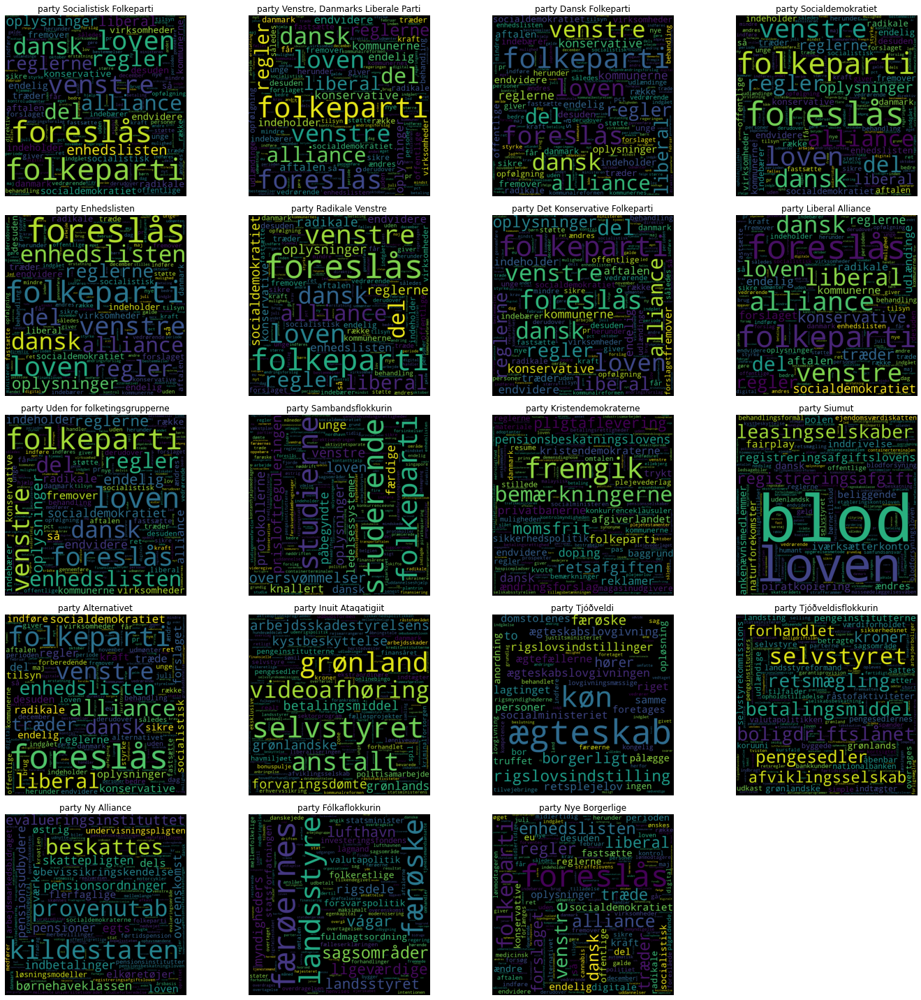

In [312]:
# Create a word cloud for each community

import matplotlib.pyplot as plt
import matplotlib.patches as patches

from matplotlib import colors
from matplotlib.lines import Line2D

from wordcloud import WordCloud, STOPWORDS

fig, axs = plt.subplots(figsize=(20, 20))
plt.subplots_adjust(hspace=0.1, wspace=0.05)
#fig.suptitle("Wordclouds of the parties", fontsize=16)

for n, party in enumerate(tf_idf.keys()):
    wordcloud = WordCloud(
                width = 800, 
                height = 800,
                background_color ='black',
                stopwords = STOPWORDS,
                collocations=False,
                ).generate_from_frequencies(tf_idf[party])
    
    # Create a subplot of the wordcloud
    ax = plt.subplot(5, 4, n+1)
    
    ax.imshow(wordcloud)
    ax.axis("off")
    ax.set_title(f'party {party}')

fig.tight_layout()
plt.show()

In [313]:
#What happens if we sort of all small parties?

#remove the smaler parties freqDist dict, that means Inuit Ataqatigiit, Tjóðveldi, Fólkaflokkurin, Tjóðveldisflokkurin, Uden for folketingsgrupperne, Sambandsflokkurin, Siumut
#Remove the following keys from the freqDist dict: [Inuit Ataqatigiit, Tjóðveldi, Fólkaflokkurin, Tjóðveldisflokkurin, Uden for folketingsgrupperne, Sambandsflokkurin, Siumut]
small_parties =  ['Inuit Ataqatigiit', 'Tjóðveldi', 'Fólkaflokkurin', 'Tjóðveldisflokkurin', 'Uden for folketingsgrupperne', 'Sambandsflokkurin', 'Siumut']
for party in small_parties:
    if party in freqDist.keys():
        del freqDist[party]

In [314]:
#print len of the token_dict for each party
for party in token_dict.keys():
    print(f'{party} len: {len(token_dict[party])}')

Socialistisk Folkeparti len: 361443
Venstre, Danmarks Liberale Parti len: 420837
Dansk Folkeparti len: 396088
Socialdemokratiet len: 414149
Enhedslisten len: 248359
Radikale Venstre len: 348628
Det Konservative Folkeparti len: 403620
Liberal Alliance len: 236421
Uden for folketingsgrupperne len: 105921
Sambandsflokkurin len: 6657
Kristendemokraterne len: 9662
Siumut len: 5983
Alternativet len: 124944
Inuit Ataqatigiit len: 3175
Tjóðveldi len: 212
Tjóðveldisflokkurin len: 980
Ny Alliance len: 5129
Fólkaflokkurin len: 524
Nye Borgerlige len: 49801


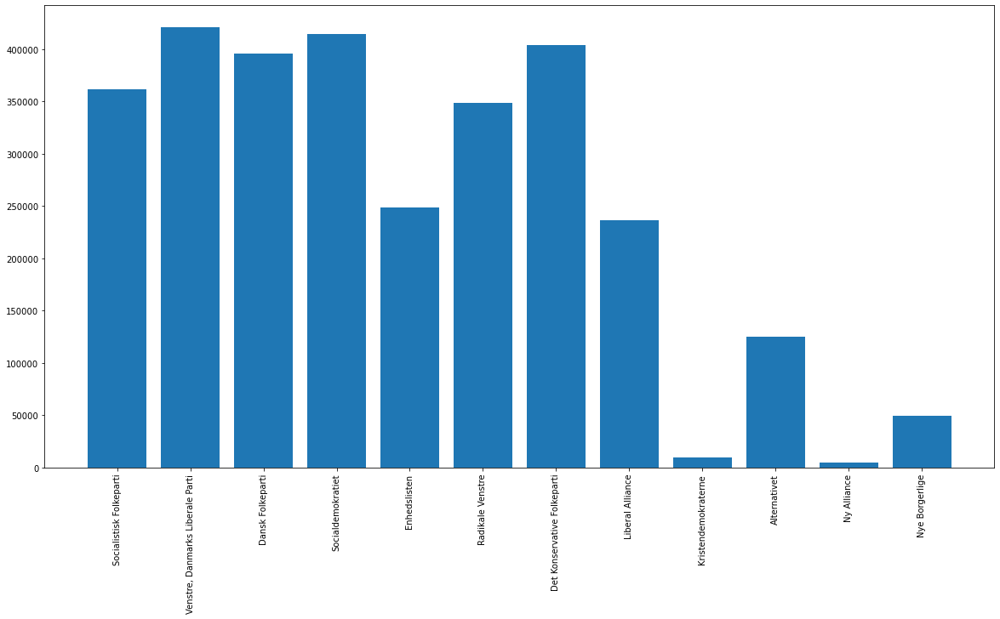

In [315]:
#plot the number of words in each party
plt.figure(figsize=(20, 10))
plt.bar(freqDist.keys(), [len(token_dict[party]) for party in freqDist.keys()])
plt.xticks(rotation=90)
plt.show()

In [316]:
#Including small parties that does not have a representative amount of laws in the dataset will scew the IDF score, so we will remove them from the freqDist dict
#Remove additionally: Ny Alliance, Kristendemokraterne and Nye Borgerlige
few_laws =  ['Ny Alliance', 'Kristendemokraterne', 'Nye Borgerlige']
for party in few_laws:
    if party in freqDist.keys():
        del freqDist[party]

In [317]:
freqDist.keys()
len(freqDist.keys())

9

In [318]:
idf = {}

for party in freqDist.keys():
    #for each community (number)
    for word in freqDist[party].keys():
        #if the word has not been IDF scored yet
        if word not in idf.keys():
            for freq_dict in freqDist.values():
                if word in freq_dict.keys():
                    #if the word is in the frequency dict of a given community, 1 to the IDF score
                    if word not in idf.keys():
                        idf[word] = 1
                    else:
                        idf[word] += 1
            #Divide the total number of communities ("documents ") with the number of communities in which the word appeared
            idf[word] = len(freqDist.keys())/ idf[word]
            idf[word] = np.log2(idf[word])


In [319]:
for party in freqDist.keys():
    for word in freqDist[party].keys():
        freqDist[party][word] = freqDist[party][word]/len(token_dict[party])


tf_idf = {}

for comm in freqDist.keys():
    tf_idf[comm] = {}
    # For each word in the community, multiply the TF and IDF score
    for word in freqDist[comm].keys():
        tf_idf[comm][word] = freqDist[comm][word] * idf[word]

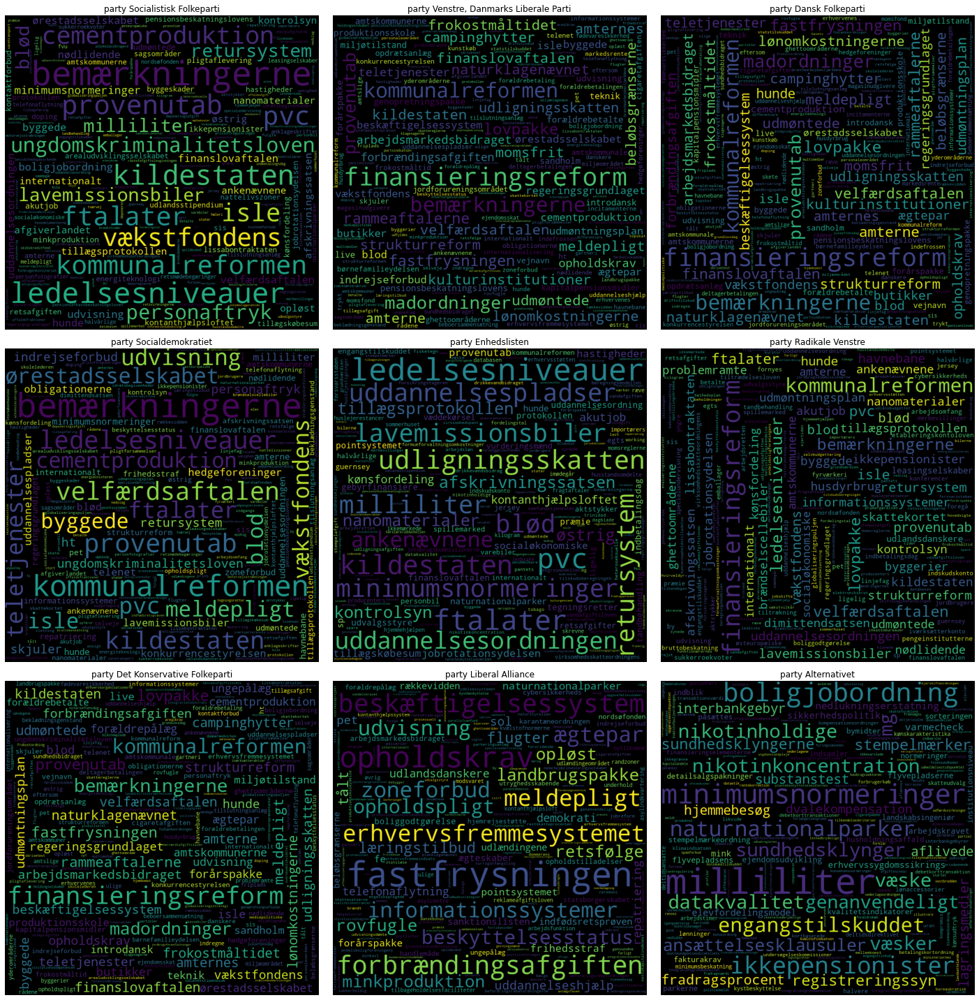

In [320]:
# Create a word cloud for each community

import matplotlib.pyplot as plt
import matplotlib.patches as patches

from matplotlib import colors
from matplotlib.lines import Line2D

from wordcloud import WordCloud, STOPWORDS

fig, axs = plt.subplots(figsize=(20, 20))
plt.subplots_adjust(hspace=0.1, wspace=0.05)
#fig.suptitle("Wordclouds of the parties", fontsize=16)

for n, party in enumerate(tf_idf.keys()):
    wordcloud = WordCloud(
                width = 800, 
                height = 800,
                background_color ='black',
                stopwords = STOPWORDS,
                collocations=False,
                ).generate_from_frequencies(tf_idf[party])
    
    # Create a subplot of the wordcloud
    ax = plt.subplot(3, 3, n+1)
    
    ax.imshow(wordcloud)
    ax.axis("off")
    ax.set_title(f'party {party}')

fig.tight_layout()
plt.show()

## TF-IDF for parties in certain period

In [321]:
# Get unique period ids
df['periode_id'].unique()

array([ 32,  31,  30,  28,  35,  27, 138, 139, 144, 146,  26,  24,  25,
        23,  22,  21,  20, 148, 150, 151, 153, 155])

In [322]:
period = 155
laws_in_period = df.loc[df['periode_id'] == period]

text_dict_in_period = get_text_for_party_yes(list(laws_in_period['resume']), list(laws_in_period['majority_party_vote']))

In [323]:
text_dict_in_period.keys()

dict_keys(['Socialdemokratiet', 'Uden for folketingsgrupperne', 'Venstre, Danmarks Liberale Parti', 'Socialistisk Folkeparti', 'Radikale Venstre', 'Dansk Folkeparti', 'Enhedslisten', 'Det Konservative Folkeparti', 'Alternativet', 'Nye Borgerlige', 'Sambandsflokkurin', 'Liberal Alliance', 'Kristendemokraterne', 'Inuit Ataqatigiit'])

In [324]:
# Tokenize the party texts
token_dict_in_period = {}
for party in text_dict_in_period.keys():
    token_dict_in_period[party] = word_tokenize(text_dict_in_period[party])

In [325]:
freqDist_in_period = {}

# Calculate the frequency distribution of the words in each party
#only process words, and consider all words as lower-case
for party in token_dict_in_period.keys():
    freqDist_in_period[party] = nltk.FreqDist(word.lower() for word in token_dict_in_period[party] if word.isalpha() and word.lower() not in stopwords)

In [326]:
# Get the top 5 words in each party
for party in sorted(freqDist_in_period.keys()):
    print(f'{party} top 5 words: {freqDist_in_period[party].most_common(5)}')

Alternativet top 5 words: [('lovforslaget', 241), ('foreslås', 168), ('kan', 92), ('kraft', 85), ('ved', 70)]
Dansk Folkeparti top 5 words: [('lovforslaget', 206), ('foreslås', 164), ('kan', 94), ('kraft', 82), ('loven', 70)]
Det Konservative Folkeparti top 5 words: [('lovforslaget', 310), ('foreslås', 232), ('kan', 130), ('kraft', 115), ('loven', 95)]
Enhedslisten top 5 words: [('lovforslaget', 299), ('foreslås', 213), ('kraft', 116), ('kan', 110), ('loven', 89)]
Inuit Ataqatigiit top 5 words: [('udgifter', 2), ('finansåret', 2), ('lovforslaget', 2), ('udgiftslofter', 2), ('finanslovforslaget', 1)]
Kristendemokraterne top 5 words: [('lovforslaget', 22), ('kan', 12), ('regeringen', 10), ('folkeparti', 9), ('foreslås', 9)]
Liberal Alliance top 5 words: [('lovforslaget', 207), ('foreslås', 145), ('kan', 84), ('kraft', 81), ('loven', 67)]
Nye Borgerlige top 5 words: [('lovforslaget', 180), ('foreslås', 153), ('kan', 85), ('kraft', 79), ('loven', 63)]
Radikale Venstre top 5 words: [('lovfo

In [327]:
#remove the smaler parties freqDist dict, that means Inuit Ataqatigiit, Tjóðveldi, Fólkaflokkurin, Tjóðveldisflokkurin, Uden for folketingsgrupperne, Sambandsflokkurin, Siumut
#Remove the following keys from the freqDist dict: [Inuit Ataqatigiit, Tjóðveldi, Fólkaflokkurin, Tjóðveldisflokkurin, Uden for folketingsgrupperne, Sambandsflokkurin, Siumut]
small_parties =  ['Inuit Ataqatigiit', 'Tjóðveldi', 'Fólkaflokkurin', 'Tjóðveldisflokkurin', 'Uden for folketingsgrupperne', 'Sambandsflokkurin', 'Siumut']
for party in small_parties:
    if party in freqDist_in_period.keys():
        del freqDist_in_period[party]

In [328]:
#Including small parties that does not have a representative amount of laws in the dataset will scew the IDF score, so we will remove them from the freqDist dict
#Remove additionally: Ny Alliance, Kristendemokraterne and Nye Borgerlige
few_laws =  ['Ny Alliance', 'Kristendemokraterne', 'Nye Borgerlige']
for party in few_laws:
    if party in freqDist_in_period.keys():
        del freqDist_in_period[party]

In [329]:
idf_in_period = {}

for comm in freqDist_in_period.keys():
    #for each community (number)
    for word in freqDist_in_period[comm].keys():
        #if the word has not been IDF scored yet
        if word not in idf_in_period.keys():
            for freq_dict in freqDist_in_period.values():
                if word in freq_dict.keys():
                    #if the word is in the frequency dict of a given community, 1 to the IDF score
                    if word not in idf_in_period.keys():
                        idf_in_period[word] = 1
                    else:
                        idf_in_period[word] += 1
            #Divide the total number of communities ("documents ") with the number of communities in which the word appeared
            idf_in_period[word] = len(freqDist_in_period.keys())/ idf_in_period[word]
            idf_in_period[word] = np.log2(idf_in_period[word])

In [330]:
for party in freqDist_in_period.keys():
    for word in freqDist_in_period[party].keys():
        freqDist_in_period[party][word] = freqDist_in_period[party][word]/len(token_dict_in_period[party])

In [331]:
tf_idf_in_period = {}

for comm in freqDist_in_period.keys():
    tf_idf_in_period[comm] = {}
    # For each word in the community, multiply the TF and IDF score
    for word in freqDist_in_period[comm].keys():
        tf_idf_in_period[comm][word] = freqDist_in_period[comm][word] * idf_in_period[word]

In [332]:
# List the top 10 words in each party according to TF-IDF
for party in sorted(tf_idf_in_period.keys()):
   
    #round the [1] element of the tuple (the TF-IDF score) to 3 decimals
    print(f'{party} top 10 words: {[(word, round(score, 3)) for word, score in sorted(tf_idf_in_period[party].items(), key=lambda x: x[1], reverse=True)[:10]]}')

Alternativet top 10 words: [('check', 0.0), ('ikkepensionister', 0.0), ('børnetilskud', 0.0), ('handelspraksis', 0.0), ('engangstilskuddet', 0.0), ('plantebeskyttelsesmidler', 0.0), ('tandpleje', 0.0), ('ungdomsuddannelser', 0.0), ('sundhedsklynger', 0.0), ('genanvendeligt', 0.0)]
Dansk Folkeparti top 10 words: [('regeringspartiet', 0.0), ('relationer', 0.0), ('statsborgerskabet', 0.0), ('engelsksprogede', 0.0), ('afdelinger', 0.0), ('indskrænkninger', 0.0), ('besøg', 0.0), ('tilkendegivelser', 0.0), ('besøgskontrol', 0.0), ('varetægtsfængslede', 0.0)]
Det Konservative Folkeparti top 10 words: [('gæld', 0.0), ('ungdomskriminalitetsloven', 0.0), ('anmodninger', 0.0), ('retshjælp', 0.0), ('sletning', 0.0), ('personaftryk', 0.0), ('arbejdstageren', 0.0), ('tidsubegrænset', 0.0), ('kontaktforbud', 0.0), ('nattelivszoner', 0.0)]
Enhedslisten top 10 words: [('ligelig', 0.0), ('kønssammensætningen', 0.0), ('øverste', 0.0), ('ledelsesniveauer', 0.0), ('kønsfordeling', 0.0), ('opstille', 0.0), 

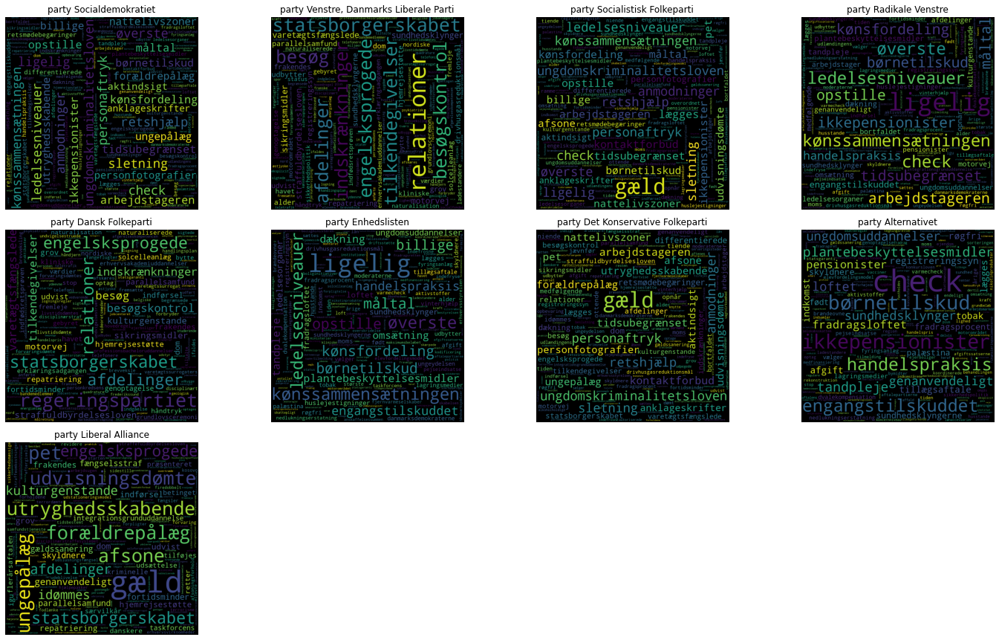

In [333]:
# Create a word cloud for each community

import matplotlib.pyplot as plt
import matplotlib.patches as patches

from matplotlib import colors
from matplotlib.lines import Line2D

from wordcloud import WordCloud, STOPWORDS

fig, axs = plt.subplots(figsize=(20, 20))
plt.subplots_adjust(hspace=0.1, wspace=0.05)
#fig.suptitle("Wordclouds of the parties", fontsize=16)

for n, party in enumerate(tf_idf_in_period.keys()):
    wordcloud = WordCloud(
                width = 800, 
                height = 800,
                background_color ='black',
                stopwords = STOPWORDS,
                collocations=False,
                ).generate_from_frequencies(tf_idf_in_period[party])
    
    # Create a subplot of the wordcloud
    ax = plt.subplot(3, 3, n+1)
    
    ax.imshow(wordcloud)
    ax.axis("off")
    ax.set_title(f'party {party}')

fig.tight_layout()
plt.show()

## TF-IDF for periods

In [334]:
#Function that creates a dict with all the text in 'resume' summed for each unique key in the periode_id column
def get_text_for_period(law_text_list, period_id_list):
    #Create a dict with the period as key and the text as value
    period_text_dict = {}
    for law_text, period_id in zip(law_text_list, period_id_list):
        #If the period is not already in the dict, add it
        if period_id not in period_text_dict:
            period_text_dict[period_id] = law_text
        else:
            period_text_dict[period_id] += law_text
    return period_text_dict

text_dict_period = get_text_for_period(list(df['resume']), list(df['periode_id']))

In [335]:
text_dict_period.keys()

dict_keys([32, 31, 30, 28, 35, 27, 138, 139, 144, 146, 26, 24, 25, 23, 22, 21, 20, 148, 150, 151, 153, 155])

In [336]:
# Tokenize the period texts
token_dict_period = {}
for period in text_dict_period.keys():
    token_dict_period[period] = word_tokenize(text_dict_period[period])

#### Calculate frequency ditribution for each period

In [337]:
freqDistPeriod = {}

# Calculate the frequency distribution of the words in each period
#only process words, and consider all words as lower-case
for period in token_dict_period.keys():
    freqDistPeriod[period] = nltk.FreqDist(word.lower() for word in token_dict_period[period] if word.isalpha() and word.lower() not in stopwords)

In [338]:
# Get the top 5 words in each period
for period in sorted(freqDistPeriod.keys()):
    print(f'{period} top 5 words: {freqDistPeriod[period].most_common(5)}')

20 top 5 words: [('lovforslaget', 96), ('baggrund', 87), ('loven', 49), ('fremgik', 46), ('kan', 45)]
21 top 5 words: [('lovforslaget', 248), ('baggrund', 167), ('l', 157), ('loven', 120), ('nr', 73)]
22 top 5 words: [('loven', 362), ('kan', 96), ('ved', 90), ('lov', 72), ('indeholder', 67)]
23 top 5 words: [('loven', 235), ('kan', 113), ('ved', 85), ('mellem', 59), ('lovforslaget', 58)]
24 top 5 words: [('kr', 9), ('forhøjes', 3), ('loven', 2), ('år', 2), ('arbejdsmarkedsbidraget', 2)]
25 top 5 words: [('loven', 219), ('kan', 112), ('ved', 91), ('kr', 59), ('danmark', 58)]
26 top 5 words: [('loven', 268), ('kan', 91), ('ved', 82), ('mellem', 63), ('dansk', 59)]
27 top 5 words: [('loven', 330), ('folkeparti', 134), ('kan', 115), ('mellem', 101), ('ved', 95)]
28 top 5 words: [('loven', 297), ('folkeparti', 148), ('kan', 123), ('dansk', 108), ('ved', 95)]
30 top 5 words: [('loven', 283), ('kan', 88), ('ved', 78), ('l', 58), ('år', 49)]
31 top 5 words: [('loven', 402), ('kan', 138), ('ved

#### Calculate IDF for each period

In [339]:
idf_period = {}

for comm in freqDistPeriod.keys():
    #for each community (number)
    for word in freqDistPeriod[comm].keys():
        #if the word has not been IDF scored yet
        if word not in idf_period.keys():
            for freq_dict in freqDistPeriod.values():
                if word in freq_dict.keys():
                    #if the word is in the frequency dict of a given community, 1 to the IDF score
                    if word not in idf_period.keys():
                        idf_period[word] = 1
                    else:
                        idf_period[word] += 1
            #Divide the total number of communities ("documents ") with the number of communities in which the word appeared
            idf_period[word] = len(freqDistPeriod.keys())/ idf_period[word]
            idf_period[word] = np.log2(idf_period[word])

In [340]:
for period in freqDistPeriod.keys():
    for word in freqDistPeriod[period].keys():
        freqDistPeriod[period][word] = freqDistPeriod[period][word]/len(token_dict_period[period])

#### Calculate TF-IDF for each period

In [341]:
tf_idf_period = {}

for comm in freqDistPeriod.keys():
    tf_idf_period[comm] = {}
    # For each word in the community, multiply the TF and IDF score
    for word in freqDistPeriod[comm].keys():
        tf_idf_period[comm][word] = freqDistPeriod[comm][word] * idf_period[word]

In [342]:
# List the top 10 words in each period according to TF-IDF
for period in sorted(tf_idf_period.keys()):
   
    #round the [1] element of the tuple (the TF-IDF score) to 3 decimals
    print(f'{period} top 10 words: {[(word, round(score, 3)) for word, score in sorted(tf_idf_period[period].items(), key=lambda x: x[1], reverse=True)[:10]]}')

20 top 10 words: [('fremgik', 0.004), ('bemærkningerne', 0.003), ('baggrund', 0.002), ('pligtaflevering', 0.002), ('retsafgiften', 0.002), ('kristendemokraterne', 0.002), ('doping', 0.001), ('bestræbelser', 0.001), ('privatbanerne', 0.001), ('reklamer', 0.001)]
21 top 10 words: [('kommunalreformen', 0.004), ('strukturreform', 0.003), ('samling', 0.003), ('omtalen', 0.003), ('udmøntningsplan', 0.003), ('fremgik', 0.002), ('genfremsættelse', 0.002), ('baggrund', 0.002), ('kommunalreform', 0.002), ('bemærkningerne', 0.002)]
22 top 10 words: [('finansieringsreform', 0.004), ('kommunalreformen', 0.002), ('lovpakke', 0.001), ('loven', 0.001), ('udviklingsforskning', 0.001), ('havnebane', 0.001), ('bestemmes', 0.001), ('afgangsprøver', 0.001), ('lønindeholdelse', 0.001), ('amtskommunale', 0.001)]
23 top 10 words: [('velfærdsaftalen', 0.003), ('sukkerroekvoter', 0.001), ('nævneværdige', 0.001), ('modulvogntog', 0.001), ('forældelsesregler', 0.001), ('kurator', 0.001), ('ht', 0.001), ('konkurre

#### Create wordclouds for each period

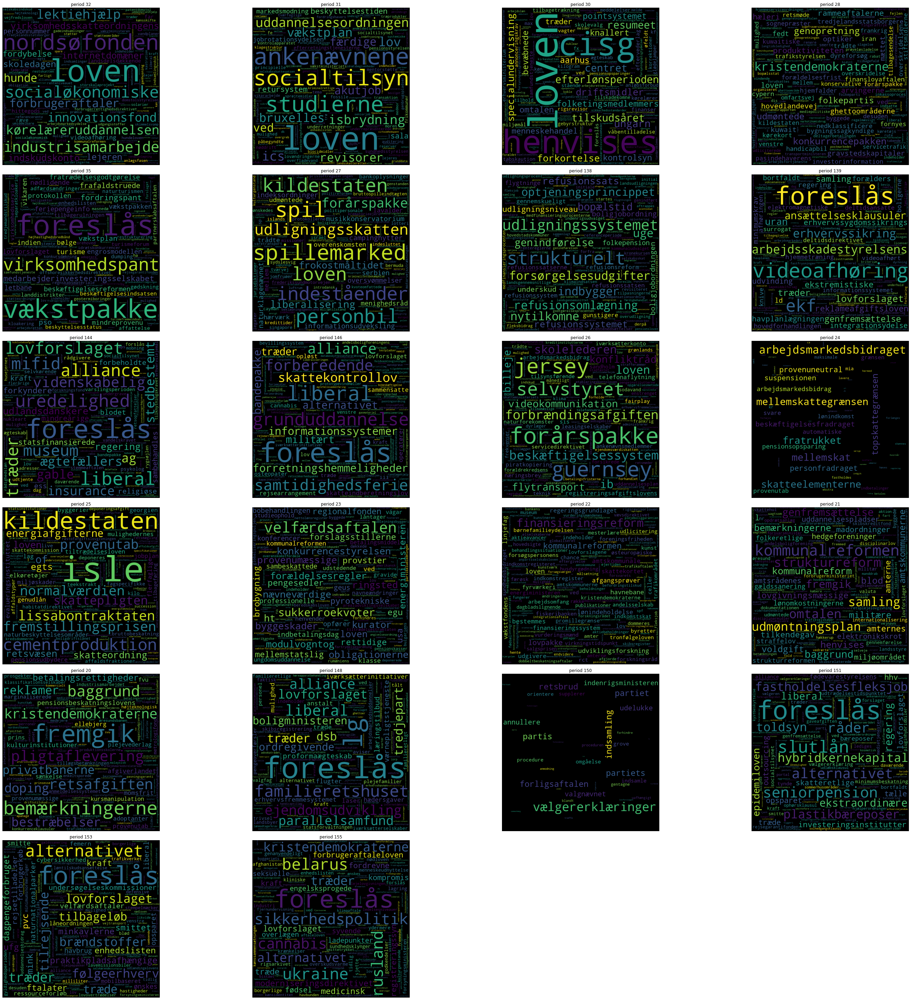

In [358]:
# Create a word cloud for each community

import matplotlib.pyplot as plt
import matplotlib.patches as patches

from matplotlib import colors
from matplotlib.lines import Line2D

from wordcloud import WordCloud, STOPWORDS

fig, axs = plt.subplots(figsize=(30, 30))
plt.subplots_adjust(hspace=0.05, wspace=0.02)

for n, period in enumerate(tf_idf_period.keys()):
    wordcloud = WordCloud(
                width = 800, 
                height = 800,
                background_color ='black',
                stopwords = STOPWORDS,
                collocations=False,
                ).generate_from_frequencies(tf_idf_period[period])
    
    # Create a subplot of the wordcloud
    ax = plt.subplot(6, 4, n+1)
    
    ax.imshow(wordcloud)
    ax.axis("off")
    ax.set_title(f'period {period}')

fig.tight_layout()
plt.show()

## TF-IDF for categories

As there are many categories, we will choose to calculate TF-IDF for the 10 most frequently used categories

In [344]:
# Get the 10 largest categories
def get_top_categories(category_list):
    # Create a dict with the categories as keys and the number of laws in each category as values
    category_dict = {}
    for categories in category_list:
        for category in categories:
            if category not in category_dict.keys():
                category_dict[category] = 1
            else:
                category_dict[category] += 1
    return category_dict

# Sort the categories by the number of laws in each category and get the 10 largest categories
largest_categories = dict(sorted(get_top_categories(df['law_category_clean']).items(), key=lambda x: x[1], reverse=True)[:10])

In [345]:
largest_categories.keys()

dict_keys(['Skatter og afgifter', 'Forsikringsvæsen', 'Undervisningsvæsen', 'Retspleje', 'Næringsvæsen', 'Kommunalvæsen', 'ARBEJDSFORHOLD', 'Sundhedsvæsen', 'Banker og pengeinstitutter', 'politisk aftale'])

In [346]:
# Function that creates a dict with all the text in 'resume' summed for each unique key in the category column
def get_text_for_category(law_text_list, category_list):
    # Create a dict with the category as key and the text as value
    category_text_dict = {}
    for law_text, categories in zip(law_text_list, category_list):
        for category in categories:
            # Check if the category is one of the 10 largest categories
            if category in largest_categories.keys():
                # If the category is not already in the dict, add it
                if category not in category_text_dict:
                    category_text_dict[category] = law_text
                else:
                    category_text_dict[category] += law_text
    return category_text_dict

text_dict_category = get_text_for_category(list(df['resume']), list(df['law_category_clean']))

In [347]:
text_dict_category.keys()

dict_keys(['Skatter og afgifter', 'politisk aftale', 'ARBEJDSFORHOLD', 'Undervisningsvæsen', 'Retspleje', 'Kommunalvæsen', 'Forsikringsvæsen', 'Næringsvæsen', 'Sundhedsvæsen', 'Banker og pengeinstitutter'])

In [348]:
# Tokenize the category texts
token_dict_categories = {}
for category in text_dict_category.keys():
    token_dict_categories[category] = word_tokenize(text_dict_category[category])

#### Calculate frequency ditribution for each category

In [349]:
freqDistCategory = {}

# Calculate the frequency distribution of the words in each category
#only process words, and consider all words as lower-case
for category in token_dict_categories.keys():
    freqDistCategory[category] = nltk.FreqDist(word.lower() for word in token_dict_categories[category] if word.isalpha() and word.lower() not in stopwords)

In [350]:
# Get the top 5 words in each category
for category in sorted(freqDistCategory.keys()):
    print(f'{category} top 5 words: {freqDistCategory[category].most_common(5)}')

ARBEJDSFORHOLD top 5 words: [('lovforslaget', 370), ('loven', 236), ('folkeparti', 211), ('foreslås', 180), ('kan', 169)]
Banker og pengeinstitutter top 5 words: [('loven', 371), ('finansielle', 310), ('lovforslaget', 289), ('række', 168), ('virksomheder', 161)]
Forsikringsvæsen top 5 words: [('lovforslaget', 945), ('loven', 811), ('folkeparti', 442), ('kraft', 425), ('lov', 386)]
Kommunalvæsen top 5 words: [('loven', 423), ('lovforslaget', 398), ('folkeparti', 233), ('l', 203), ('kan', 189)]
Næringsvæsen top 5 words: [('loven', 576), ('lovforslaget', 419), ('kan', 244), ('ved', 216), ('virksomheder', 212)]
Retspleje top 5 words: [('loven', 853), ('lovforslaget', 665), ('kan', 453), ('foreslås', 420), ('kraft', 357)]
Skatter og afgifter top 5 words: [('loven', 1167), ('lovforslaget', 1036), ('foreslås', 947), ('folkeparti', 886), ('ved', 840)]
Sundhedsvæsen top 5 words: [('lovforslaget', 289), ('loven', 275), ('kan', 169), ('ved', 137), ('kraft', 115)]
Undervisningsvæsen top 5 words: [

#### Calculate idf for each category

In [351]:
idf_category = {}

for comm in freqDistCategory.keys():
    #for each community (number)
    for word in freqDistCategory[comm].keys():
        #if the word has not been IDF scored yet
        if word not in idf_category.keys():
            for freq_dict in freqDistCategory.values():
                if word in freq_dict.keys():
                    #if the word is in the frequency dict of a given community, 1 to the IDF score
                    if word not in idf_category.keys():
                        idf_category[word] = 1
                    else:
                        idf_category[word] += 1
            #Divide the total number of communities ("documents ") with the number of communities in which the word appeared
            idf_category[word] = len(freqDistCategory.keys())/ idf_category[word]
            idf_category[word] = np.log2(idf_category[word])

In [352]:
for category in freqDistCategory.keys():
    for word in freqDistCategory[category].keys():
        freqDistCategory[category][word] = freqDistCategory[category][word]/len(token_dict_categories[category])

#### Calculate TF-IDF for each category

In [353]:
tf_idf_category = {}

for comm in freqDistCategory.keys():
    tf_idf_category[comm] = {}
    # For each word in the community, multiply the TF and IDF score
    for word in freqDistCategory[comm].keys():
        tf_idf_category[comm][word] = freqDistCategory[comm][word] * idf_category[word]

In [354]:
# List the top 10 words in each category according to TF-IDF
for category in sorted(tf_idf_category.keys()):
    #round the [1] element of the tuple (the TF-IDF score) to 3 decimals
    print(f'{category} top 10 words: {[(word, round(score, 3)) for word, score in sorted(tf_idf_category[category].items(), key=lambda x: x[1], reverse=True)[:10]]}')

ARBEJDSFORHOLD top 10 words: [('barselsloven', 0.001), ('ledige', 0.001), ('ressourceforløb', 0.001), ('fleksjob', 0.001), ('sygedagpenge', 0.001), ('barselsdagpenge', 0.001), ('fleksydelsesordningen', 0.001), ('dagpenge', 0.001), ('dagpengemodtagere', 0.001), ('arbejdsgivere', 0.0)]
Banker og pengeinstitutter top 10 words: [('finansielle', 0.003), ('finanstilsynet', 0.002), ('nødlidende', 0.002), ('finanstilsynets', 0.001), ('hvidvaskloven', 0.001), ('mifid', 0.001), ('stabilitet', 0.001), ('systemiske', 0.001), ('realkreditinstitutter', 0.001), ('hvidvask', 0.001)]
Forsikringsvæsen top 10 words: [('ressourceforløb', 0.001), ('pension', 0.001), ('kontanthjælp', 0.001), ('finansielle', 0.001), ('sygedagpenge', 0.0), ('sygemeldte', 0.0), ('ressourceforløbsydelse', 0.0), ('finanstilsynet', 0.0), ('flygtninge', 0.0), ('bopælstid', 0.0)]
Kommunalvæsen top 10 words: [('finansieringsreform', 0.001), ('oversvømmelser', 0.001), ('planlovens', 0.001), ('gødskning', 0.001), ('amternes', 0.001), 

#### Create wordclouds for each category

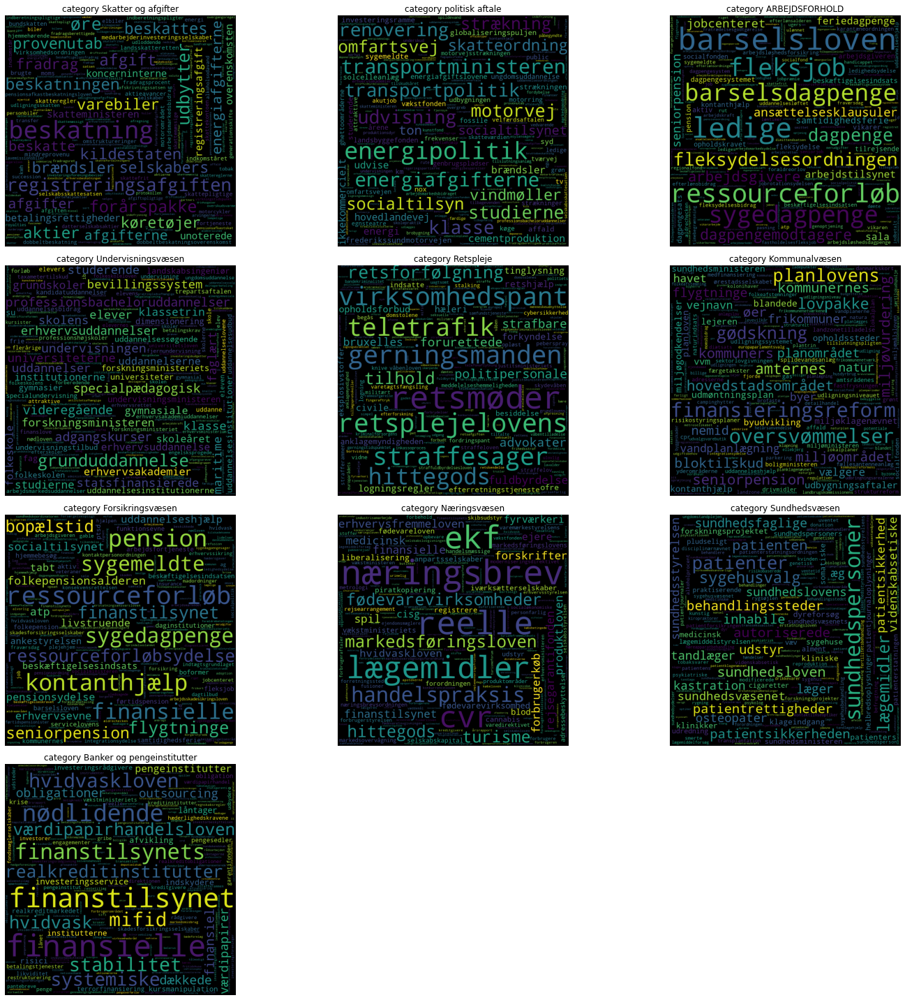

In [355]:
# Create a word cloud for each community

import matplotlib.pyplot as plt
import matplotlib.patches as patches

from matplotlib import colors
from matplotlib.lines import Line2D

from wordcloud import WordCloud, STOPWORDS

fig, axs = plt.subplots(figsize=(20, 20))
plt.subplots_adjust(hspace=0.1, wspace=0.05)
#fig.suptitle("Wordclouds of the parties", fontsize=16)

for n, category in enumerate(tf_idf_category.keys()):
    wordcloud = WordCloud(
                width = 800, 
                height = 800,
                background_color ='black',
                stopwords = STOPWORDS,
                collocations=False,
                ).generate_from_frequencies(tf_idf_category[category])
    
    # Create a subplot of the wordcloud
    ax = plt.subplot(4, 3, n+1)
    
    ax.imshow(wordcloud)
    ax.axis("off")
    ax.set_title(f'category {category}')

fig.tight_layout()
plt.show()